# AI - IMAGE CAPTIONING BOT 

# BY - KARTIK KARIRA


# INDEX 

1. prerequisites 

2. Data collection

3. Understanding the data

4. Data Cleaning

5. Loading the training set

6. Data Preprocessing — Images

7. Data Preprocessing — Captions

8. Data Preparation using Generator Function

9. Word Embeddings

10. Model Architecture

11. Training of Model

12. predictions

#1. prerequisites 
 1. mounting the google drive to the google colab notebook
 2. importing the required liberaries 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import keras
import re

import nltk
from nltk.corpus import stopwords
import string
import json
from time import time

import pickle

from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from keras.preprocessing import image
from keras.models import Model, load_model
from keras.preprocessing.sequence import pad_sequences



In [ ]:
!pip install keras


In [ ]:
!pip install np_utils

#  2. DATA COLLECTION

In [ ]:
def readTextFile(path):
    with open(path) as f:
        captions = f.read()
    return captions

In [ ]:
captions  = readTextFile("/content/drive/MyDrive/Colab Notebooks/captions.txt")
captions = captions.split("\n")   [:-1]
# and removing the last element as it was an empty string 
# splitting captions by the new line chatacter using python split function 
# to get all the captinos differently 
len(captions)


40456

In [ ]:
print(captions[1] )
# we can see what is the format of one caption 
# caption ==  image id + "," + caption 
print(captions[0])

1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
image,caption


In [ ]:
# we are removing the first caption in the list as it is not useful 
captions.pop(0)
print(captions[0])


1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .


In [ ]:
captions[0].split('.jpg,')

# we split the caption with the .jpg as there are many commas in the line 


['1000268201_693b08cb0e',
 'A child in a pink dress is climbing up a set of stairs in an entry way .']

In [ ]:
# dictionary to  match each image with the list of captions it has 
#  iterate over  all the elemets 
#  0. split the element around '.jpg,' as only comma is repeated multiple times in th e sentences 
#  1. read the image id from every line  - from first part by splitting   
#  2 . second = description


descriptions = {}

for x in captions:
  first,second = x.split('.jpg,')
  img_name = first
  

  #  if the image id is already presene or not 
  if descriptions.get(img_name) is None:
    descriptions[img_name]=[]  
    #  creating it if it dosnt exist 

  descriptions[img_name].append(second)

  
  


# 3. Understanding the data

In [ ]:
descriptions["1000268201_693b08cb0e"]

# captions for the  below image 

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

drawing a particular image - how can we do it with cv2 - 

to see if the captins are consistent with our captions

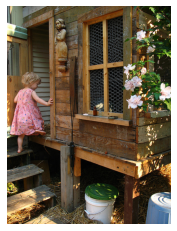

In [ ]:
IMG_PATH = "/content/drive/MyDrive/Colab Notebooks/Images/"
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(IMG_PATH+"1000268201_693b08cb0e.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
#  as cv2 read images in BGR format so we must convert the colors into rgb to view them correctly 
plt.imshow(img)
plt.axis("off")
plt.show()


#  4. DATA CLEANING 

in data cleaning we are not doing stemming  or stop word removal as we want correct english for our captions 

1. we can make all the alphabets as lower case  - to reduce vocal size 

2. remove punctuations  , numbers , any non alphabetical digits 

3. we can also remove the hanging  "s"

4. we can also remove single digit words 


In [ ]:
def clean_text (sentence):
  sentence = sentence.lower()
  sentence = re.sub("[^a-z]+"," ",sentence)
  sentence = sentence.split()
  
  sentence  = [s for s in sentence if len(s)>1]
  sentence = " ".join(sentence)
  return sentence


cleaning all the captions 

In [ ]:
for key , caption_list in descriptions.items():
  for i in range(len(caption_list )):
    caption_list[i] = clean_text(caption_list[i])

In [ ]:
descriptions["1000268201_693b08cb0e"]

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

## write the data to a text file so that we dont need to do the work again and again 

In [ ]:
with open("descriptions_1.txt","w") as f:
    f.write(str(descriptions))

#  creating a vocab

Create a vocabulary of all the unique words present across all the 8000*5 (i.e. 40000) image captions (corpus) in the data set

In [ ]:
# as we have saved the python dictionary as a txt file we have to reconvert this file
#  into a python dictionary 


#  so we use this function 

descriptions = None
with open("descriptions_1.txt",'r') as f:
    descriptions= f.read()
    
json_acceptable_string = descriptions.replace("'","\"")
descriptions = json.loads(json_acceptable_string)

In [ ]:
print(type(descriptions))

<class 'dict'>


In [ ]:
descriptions["1000268201_693b08cb0e"]


['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [ ]:
# using set to create vocab 

# Sets are used to store multiple items in a single variable.
# Set is one of 4 built-in data types in Python used to store collections of data,
#  the other 3 are List, Tuple, and Dictionary, 

# sets do not contain duplicate items and are not in any particular order  and items must be immutable objects 
# they dont have indexes  and automatically remove  duplicate itenms 
# to create empty sets we use set() as {} creates a dictionary 

vocab = set()
for key in descriptions.keys():
  [vocab.update(sentence.split()) for sentence in descriptions[key]]

print('Original Vocabulary Size: %d' % len(vocab))

Original Vocabulary Size: 8424


This means we have 8424 unique words across all the 40000 image captions.

In [ ]:
total_words = []

for key in descriptions.keys():
    [total_words.append(i) for des in descriptions[key] for i in des.split()]
    
print("Total Words %d"%len(total_words))

# des is a caption
# i ais a paritcular word in that  caption through  des.split()
#description[key ] is a list 

Total Words 373803


In [ ]:
print(total_words[:10])

['child', 'in', 'pink', 'dress', 'is', 'climbing', 'up', 'set', 'of', 'stairs']


# shortening the vocal by  keeping the most frequent words  

## frequency >=  10  -->> threshold

 many of these words will occur very few times, say 1, 2 or 3 times.
 
  Since we are creating a predictive model, we would not like to have all the words present in our vocabulary but the words which are more likely to occur or which are common. 
  
  This helps the model become more robust to outliers and make less mistakes.

  
Hence we consider only those words which occur at least 10 times in the entire corpus.

In [ ]:
import collections

counter = collections.Counter(total_words)
freq_cnt = dict(counter)
print(len(freq_cnt.keys()))
print(freq_cnt)

8424
{'child': 1545, 'in': 18986, 'pink': 739, 'dress': 348, 'is': 9345, 'climbing': 507, 'up': 1302, 'set': 109, 'of': 6723, 'stairs': 109, 'an': 2432, 'entry': 1, 'way': 53, 'girl': 3328, 'going': 149, 'into': 1074, 'wooden': 284, 'building': 510, 'little': 1768, 'playhouse': 6, 'the': 18419, 'to': 3176, 'her': 1178, 'cabin': 4, 'black': 3848, 'dog': 8138, 'and': 8862, 'spotted': 38, 'are': 3504, 'fighting': 133, 'tri': 14, 'colored': 221, 'playing': 2008, 'with': 7765, 'each': 430, 'other': 773, 'on': 10745, 'road': 398, 'white': 3959, 'brown': 2578, 'spots': 29, 'staring': 57, 'at': 2915, 'street': 944, 'two': 5642, 'dogs': 2125, 'different': 46, 'breeds': 5, 'looking': 743, 'pavement': 48, 'moving': 41, 'toward': 146, 'covered': 372, 'paint': 62, 'sits': 577, 'front': 1386, 'painted': 64, 'rainbow': 22, 'hands': 246, 'bowl': 30, 'sitting': 1368, 'large': 1236, 'small': 1278, 'grass': 1622, 'plays': 526, 'fingerpaints': 3, 'canvas': 6, 'it': 401, 'there': 304, 'pigtails': 14, 'pain

In [ ]:
# Sort this dictionary according to the freq count

sorted_freq_cnt = sorted( freq_cnt.items() ,reverse=True ,key=lambda x:x[1] )

# sorting using the inbuild function of python and the key for sorting will be defined by lambda function
# which is equal to the frequency count of each element  treat the key as  x[1]

# Filter
threshold = 10
sorted_freq_cnt  = [x for x in sorted_freq_cnt if x[1]>threshold]

total_words = [x[0] for x in sorted_freq_cnt]

In [ ]:
print(len(total_words))

1845


So now we have only 1845 unique words in our vocabulary. 

# 4. PREPAIRING  TRAIN AND TEST DATA 


In [ ]:
 train= list()
 test = list()
 for key in descriptions.keys():
   if len(train)<7000:
      train.append(key)
   else:
    test.append(key)

In [ ]:
print(len(train))
print(len(test))

7000
1091


thus our traingin data has 7000 images 
and test data  has 1091 images 

In [ ]:
train[:5]

['1000268201_693b08cb0e',
 '1001773457_577c3a7d70',
 '1002674143_1b742ab4b8',
 '1003163366_44323f5815',
 '1007129816_e794419615']

## Loading the training set

In [ ]:
# Prepare Description for the Training Data
# Tweak - Add <s> and <e> token to our training data

train_descriptions = {}

for img_id in train:
    train_descriptions[img_id] = []
    for cap in descriptions[img_id]:
        cap_to_append = "startseq "  + cap + " endseq"
        train_descriptions[img_id].append(cap_to_append)

In [ ]:
train_descriptions["1000268201_693b08cb0e"]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

# 5. **Data Preprocessing — Images**
Images --> Features
Text ---> Features

In [ ]:
# Get the Resnet 50  model trained on imagenet data

model = ResNet50(weights="imagenet",input_shape=(224,224,3))

model.summary()

# in this problem we have skip connections to solve the peoblem of back propagation 

# using this model as a feature extrator 

102973440/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
________________________

In [ ]:
model.layers[-2].output

<KerasTensor: shape=(None, 2048) dtype=float32 (created by layer 'avg_pool')>

In [ ]:
# Remove the last layer (output softmax layer) from the Resnet 50 
model_new = Model(model.input, model.layers[-2].output)

#our new model has 2048 output features 

Now, we pass every image to this model to get the corresponding 2048 length feature vector as follows:

In [ ]:
# we are going to make image vectors for all the  images and get the output as file and save it 


def preprocess_img(img):
  img = image.load_img(img,target_size=(224,224))
  img = image.img_to_array(img)
  img = np.expand_dims(img,axis=0)
    # Normalisation
  img = preprocess_input(img)
    # this is the resnet 50 preprocessing method 
  return img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


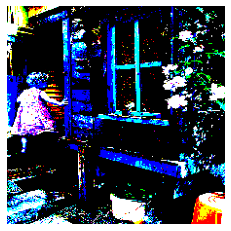

In [ ]:
img = preprocess_img(IMG_PATH+"1000268201_693b08cb0e.jpg")
plt.imshow(img[0])
plt.axis("off")
plt.show()
# output after applying th e model specified preprocessing 
#  finding mea across every channel and  subtracting th at from every pixel to normalize the data 

In [ ]:
def encode_image(img):
    img = preprocess_img(img)
    feature_vector = model_new.predict(img)
    
    feature_vector = feature_vector.reshape((-1,))
    #print(feature_vector.shape)
    return feature_vector

In [ ]:
encode_image(IMG_PATH+"1000268201_693b08cb0e.jpg")

array([0.06535931, 0.16782546, 0.32517618, ..., 0.05107123, 0.32821232,
       1.004337  ], dtype=float32)

In [ ]:

encoding_train = {}
#image_id -->feature_vector extracted from Resnet Image

#  dictionary to store image vector 
for ix,img_id in enumerate(train):
    img_path = IMG_PATH+"/"+img_id+".jpg"
    encoding_train[img_id] = encode_image(img_path)
    
    if ix%100==0:
        print("Encoding in Progress Time step %d "%ix)
        



Encoding in Progress Time step 0 
Encoding in Progress Time step 100 
Encoding in Progress Time step 200 
Encoding in Progress Time step 300 
Encoding in Progress Time step 400 
Encoding in Progress Time step 500 
Encoding in Progress Time step 600 
Encoding in Progress Time step 700 
Encoding in Progress Time step 800 
Encoding in Progress Time step 900 
Encoding in Progress Time step 1000 
Encoding in Progress Time step 1100 
Encoding in Progress Time step 1200 
Encoding in Progress Time step 1300 
Encoding in Progress Time step 1400 
Encoding in Progress Time step 1500 
Encoding in Progress Time step 1600 
Encoding in Progress Time step 1700 
Encoding in Progress Time step 1800 
Encoding in Progress Time step 1900 
Encoding in Progress Time step 2000 
Encoding in Progress Time step 2100 
Encoding in Progress Time step 2200 
Encoding in Progress Time step 2300 
Encoding in Progress Time step 2400 
Encoding in Progress Time step 2500 
Encoding in Progress Time step 2600 
Encoding in P

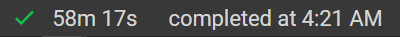

We save all the bottleneck train features in a Python dictionary and save it on the disk using Pickle file, namely “encoded_train_features.pkl” whose keys are image names and values are corresponding 2048 length feature vector.

In [ ]:
!mkdir saved

In [ ]:
# Store everything to the disk 
with open("saved/encoded_train_features.pkl","wb") as f:
    pickle.dump(encoding_train,f)

doing the same for test images


In [ ]:

encoding_test = {}
#image_id -->feature_vector extracted from Resnet Image

for ix,img_id in enumerate(test):
    img_path = IMG_PATH+"/"+img_id+".jpg"
    encoding_test[img_id] = encode_image(img_path)
    
    if ix%100==0:
        print("Test Encoding in Progress Time step %d "%ix)
        

Test Encoding in Progress Time step 0 
Test Encoding in Progress Time step 100 
Test Encoding in Progress Time step 200 
Test Encoding in Progress Time step 300 
Test Encoding in Progress Time step 400 
Test Encoding in Progress Time step 500 
Test Encoding in Progress Time step 600 
Test Encoding in Progress Time step 700 
Test Encoding in Progress Time step 800 
Test Encoding in Progress Time step 900 
Test Encoding in Progress Time step 1000 


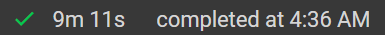

In [ ]:
with open("saved/encoded_test_features.pkl","wb") as f:
    pickle.dump(encoding_test,f)

# 7. Data Preprocessing — Captions

We must note that captions are something that we want to predict. So during the training period, captions will be the target variables (Y) that the model is learning to predict.

But the prediction of the entire caption, given the image does not happen at once. We will predict the caption word by word. Thus, we need to encode each word into a fixed sized vector. However, this part will be seen later when we look at the model design, but for now we will create two Python Dictionaries namely “wordtoix” (pronounced — word to index) and “ixtoword” (pronounced — index to word).

Stating simply, we will represent every unique word in the vocabulary by an integer (index). As seen above, we have 1845 unique words in the corpus and thus each word will be represented by an integer index between 1 to 1845.

These two Python dictionaries can be used as follows:

word_to_idx[‘abc’] -> returns index of the word ‘abc’

idx_to_word[k] -> returns the word whose index is ‘k’

In [ ]:
word_to_idx = {}
idx_to_word = {}

for i,word in enumerate(total_words):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

#  i+1 as we are reserving the index 0  
#  0 index is for space or empty word  

In [ ]:
# Two special words
idx_to_word[1846] = 'startseq'
word_to_idx['startseq'] = 1846

idx_to_word[1847] = 'endseq'
word_to_idx['endseq'] = 1847

vocab_size = len(word_to_idx) + 1
print("Vocab Size",vocab_size)

Vocab Size 1848


There is one more parameter that we need to calculate, i.e., the maximum length of a caption

In [ ]:
max_len = 0 
for key in train_descriptions.keys():
    for cap in train_descriptions[key]:
        max_len = max(max_len,len(cap.split()))
        
print(max_len)

35


# 8. Data Preparation using Generator Function

It must be noted that, one image+caption is not a single data point but are multiple data points depending on the length of the caption

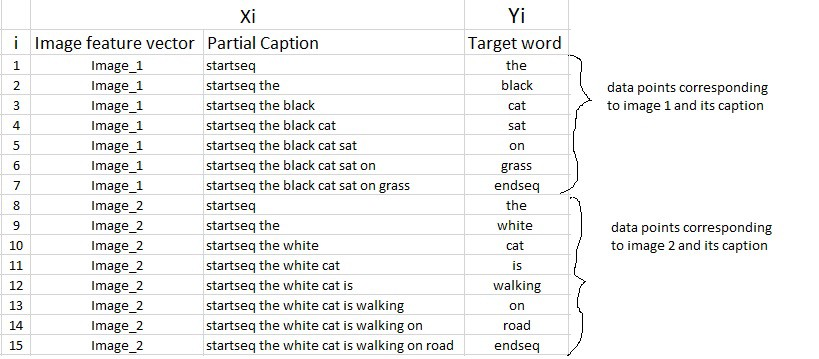

We must  understand that in every data point, it’s not just the image which goes as input to the system,
 but also, a partial caption which helps to predict the next word in the sequence.
 
Since we are processing sequences, we will employ a Recurrent Neural Network to read these partial captions 

However, we have already discussed that we are not going to pass the actual English text of the caption, rather we are going to pass the sequence of indices where each index represents a unique word.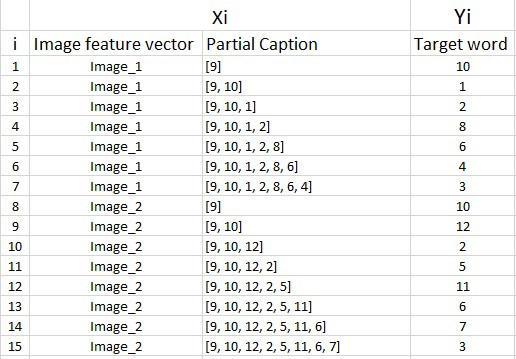

Since we would be doing batch processing (explained later), we need to make sure that each sequence is of equal length.
 Hence we need to append 0’s (zero padding) at the end of each sequence. But how many zeros should we append in each sequence?

we had calculated the maximum length of a caption, which is 35 we will use it 

in our actual training dataset we have 6000 images, each having 5 captions. This makes a total of 30000 images and captions.

Even if we assume that each caption on an average is just 7 words long, it will lead to a total of 30000*7 i.e. 210000 data points.

Size of the data matrix = n*m

Where n-> number of data points (assumed as 210000)

And m-> length of each data point

Clearly m= Length of image vector(2048) + Length of partial caption(x).

m = 2048 + x

But what is the value of x?
 it is not 35,

Every word (or index) will be mapped (embedded) to higher dimensional space through one of the word embedding techniques.

 each word/index is mapped to a 200-long vector using a pre-trained GLOVE word embedding model.

Now each sequence contains 35 indices, where each index is a vector of length 200. Therefore x = 34*200 = 7000

Hence, m = 2048 + 7000 = 9048.

Finally, size of data matrix= 210000 * 9048= 19000080000 blocks.

Now even if we assume that one block takes 2 byte, then, to store this data matrix, we will require more than 3 GB of main memory.

In [ ]:
def data_generator(train_descriptions,encoding_train,word_to_idx,max_len,batch_size):
    X1,X2, y = [],[],[]
    # x1 = image 
    # x2= partial vector 
    # y  = predicted word 
    
    n =0
    while True:
        for key,desc_list in train_descriptions.items():
            n += 1
            
            photo = encoding_train[key+".jpg"] # image id 
            for desc in desc_list:   
              # picking out one particular description / caption form the list corresponding to the image id and converting it into words 
                
                seq = [word_to_idx[word] for word in desc.split() if word in word_to_idx]

                #  generating  the sezuences from the caption 
                #  where xi are the input words and yi is the target wors 
                #  and we are making many rows of data through this method 
                for i in range(1,len(seq)):
                    xi = seq[0:i]
                    yi = seq[i]
                    
                    #0 denote padding word 
                    #  so that each xi is of same length 

                    xi = pad_sequences([xi],maxlen=max_len,value=0,padding='post')[0]
                    #  putting [0] at the end as this method accepts a 2d matrix
                    #  and we are doing one dimentional vector so we add[0]
                    yi = to_categorcial([yi],num_classes=vocab_size)[0]
                    # yi will be a one hot vector 
                    
                    X1.append(photo)
                    X2.append(xi)
                    #  to be converted into glove embedding 
                    y.append(yi)
                    #  as genrrerator remembers the state of the function so we use yield 
                if n==batch_size:
                    yield [[np.array(X1),np.array(X2)],np.array(y)]
                    X1,X2,y = [],[],[]
                    n = 0

# 9.  **Word Embeddings**
## woring with glove vector

In [ ]:
f = open("/content/drive/MyDrive/Colab Notebooks/glove.6B.50d.txt",encoding='utf8')


In [ ]:
embedding_index = {}
# dictionary to save the words and their vectors 

for line in f:
    values = line.split()
    
    word = values[0]
    word_embedding = np.array(values[1:],dtype='float')
    embedding_index[word] = word_embedding
    

In [ ]:
f.close()

In [ ]:
embedding_index['apple']

array([ 0.52042 , -0.8314  ,  0.49961 ,  1.2893  ,  0.1151  ,  0.057521,
       -1.3753  , -0.97313 ,  0.18346 ,  0.47672 , -0.15112 ,  0.35532 ,
        0.25912 , -0.77857 ,  0.52181 ,  0.47695 , -1.4251  ,  0.858   ,
        0.59821 , -1.0903  ,  0.33574 , -0.60891 ,  0.41742 ,  0.21569 ,
       -0.07417 , -0.5822  , -0.4502  ,  0.17253 ,  0.16448 , -0.38413 ,
        2.3283  , -0.66682 , -0.58181 ,  0.74389 ,  0.095015, -0.47865 ,
       -0.84591 ,  0.38704 ,  0.23693 , -1.5523  ,  0.64802 , -0.16521 ,
       -1.4719  , -0.16224 ,  0.79857 ,  0.97391 ,  0.40027 , -0.21912 ,
       -0.30938 ,  0.26581 ])

In [ ]:
def get_embedding_matrix():
    emb_dim = 50
    matrix = np.zeros((vocab_size,emb_dim))
    for word,idx in word_to_idx.items():
        embedding_vector = embedding_index.get(word)
        
        if embedding_vector is not None:
            matrix[idx] = embedding_vector
            
    return matrix

    #  if the word exists in the vocab we get that word 
    #  else we substitute it with all 0 

In [ ]:
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(1848, 50)

# 10.  Model Architecture
Since the input consists of two parts, an image vector and a partial caption, we cannot use the Sequential API provided by the Keras library. For this reason, we use the Functional API which allows us to create Merge Models.

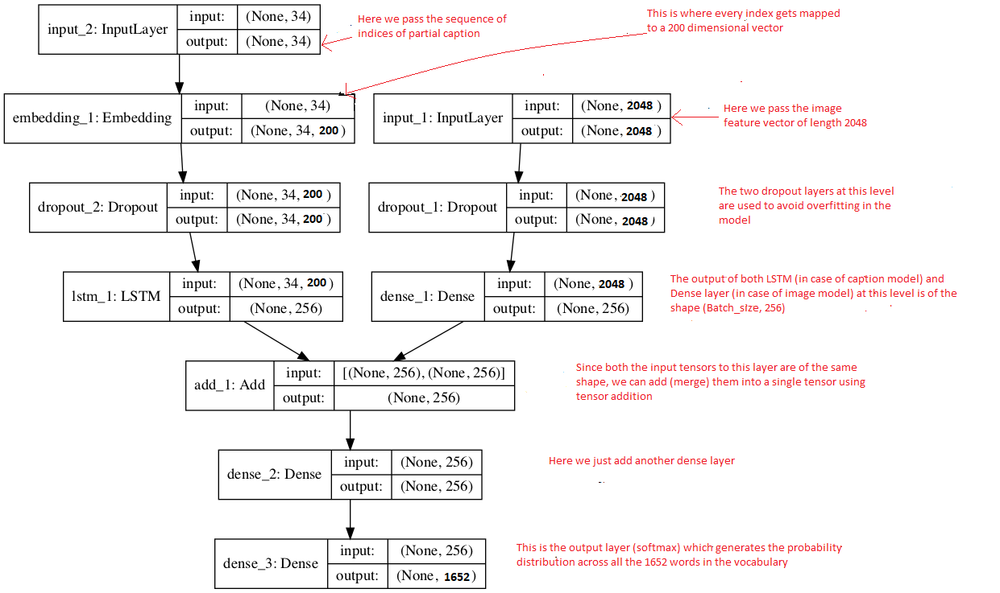

## image model

In [ ]:
# from keras.utils import to_categorical
from keras.layers import Input, Dense, Dropout, Embedding, LSTM
from keras.layers.merge import add

In [ ]:
#  the features were saved in a file and we will be giving those features to the model here 
input_img_features = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_features)

#  applying droput layer to avoid over fitting in the model 
inp_img2 = Dense(256,activation='relu')(inp_img1)

## caption model

In [ ]:
input_captions = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim=vocab_size,output_dim=50,mask_zero=True)(input_captions)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

## model to add both the layers 

In [ ]:
#  input is th eoutput generated form image model and the  output generated form th e caption model 
decoder1 = add([inp_img2,inp_cap3])
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size,activation='softmax')(decoder2)

# Combined Model
model = Model(inputs=[input_img_features,input_captions],outputs=outputs)


In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 35)]         0                                            
__________________________________________________________________________________________________
input_1 (InputLayer)            [(None, 2048)]       0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 35, 50)       92400       input_2[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 2048)         0           input_1[0][0]                    
____________________________________________________________________________________________

In [ ]:
# Important Thing preinitializing the - Embedding Layer
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False
#  weights we have generated in the  embedding matrix and we say do not train this layer 

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer="adam")

# 11. Training of Model

In [ ]:
epochs = 20
batch_size = 3
steps = len(train_descriptions)
# number_pics_per_batch

In [ ]:
def train():
    
    for i in range(epochs):
        generator = data_generator(train_descriptions,encoding_train,word_to_idx,max_len,batch_size)
        model.fit_generator(generator,epochs=1,steps_per_epoch=steps,verbose=1)
        model.save('./saved/model_'+str(i)+'.h5')

In [ ]:
model = load_model("/content/drive/MyDrive/Colab Notebooks/model_9.h5")

# 12. predictions 

In [ ]:
def predict_caption(photo):
    
    in_text = "startseq"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=max_len,padding='post')
        
        ypred = model.predict([photo,sequence])
        ypred = ypred.argmax() #WOrd with max prob always - Greedy Sampling

        #  we can also pick top 3 words and add randomness to our captions 

        word = idx_to_word[ypred]
        in_text += (' ' + word)
        
        if word == "endseq":
            break
    #  final word we remove th estart word and the end word 
    
    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)
    return final_caption

In [ ]:
# Pick Some Random Images and See Results
plt.style.use("seaborn")

def how_many_pred(numb):


  for i in range(numb):
    idx = np.random.randint(0,1000)
    all_img_names = list(encoding_test.keys())

    img_name = all_img_names[idx]

    photo_2048 = encoding_test[img_name].reshape((1,2048))
    
    i = plt.imread("/content/drive/MyDrive/Colab Notebooks/Images/"+img_name+".jpg")
    
    caption = predict_caption(photo_2048)
    #print(caption)
    
    plt.title(caption)
    plt.imshow(i)
    plt.axis("off")
    plt.show()

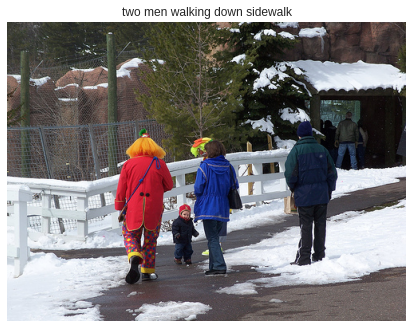

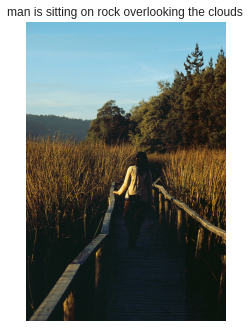

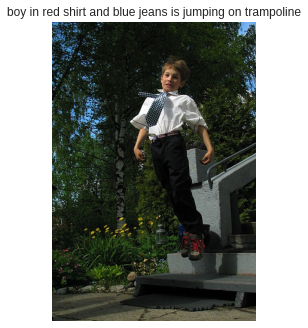

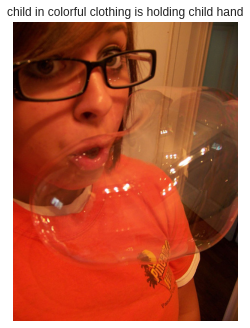

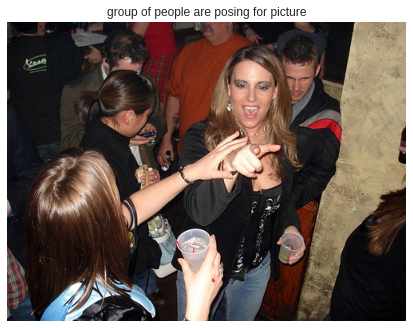

In [ ]:
how_many_pred(5)

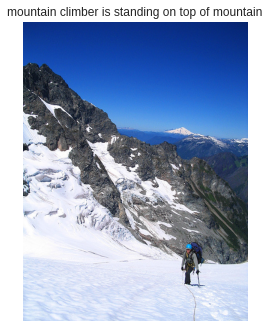

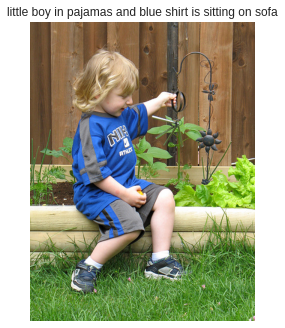

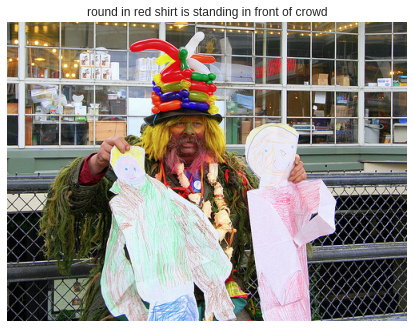

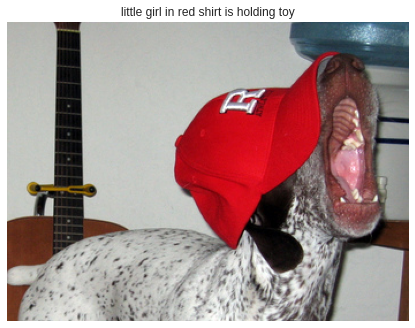

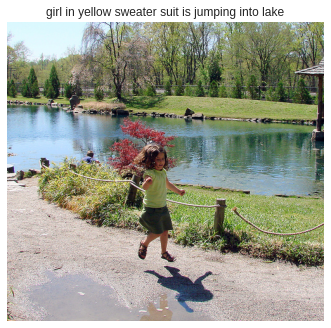

...

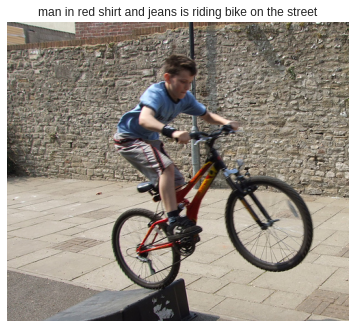

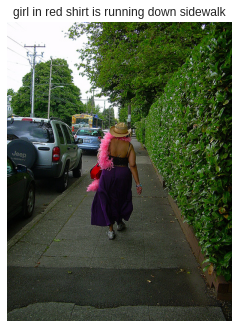

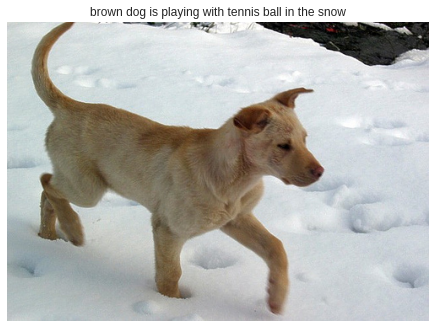

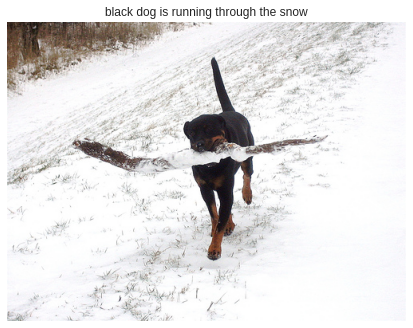

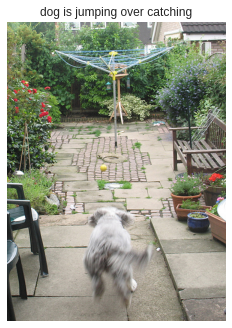

In [ ]:
how_many_pred(15)

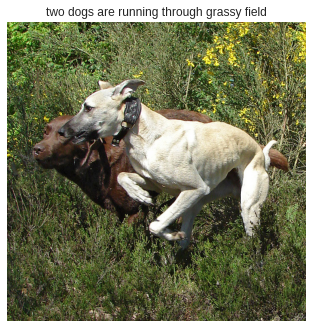

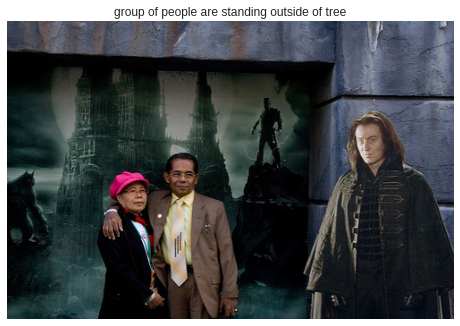

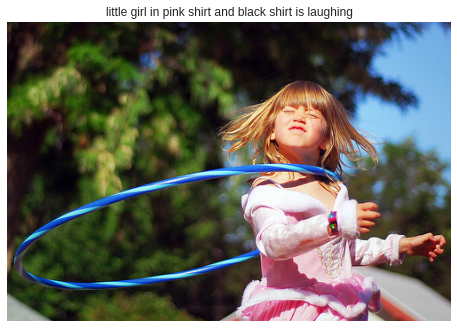

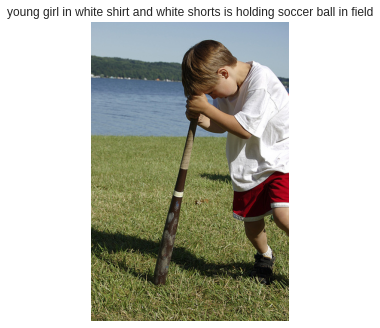

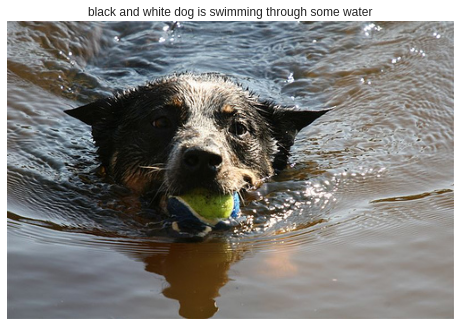

...

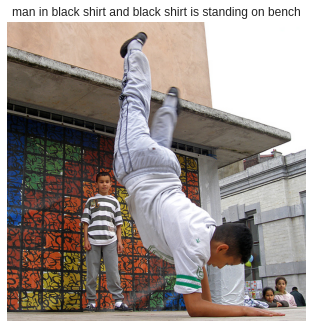

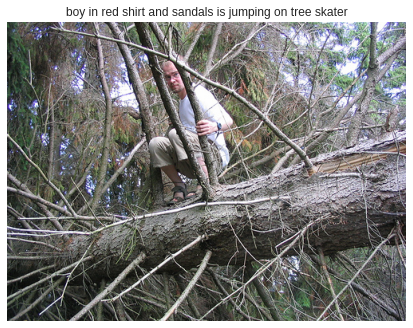

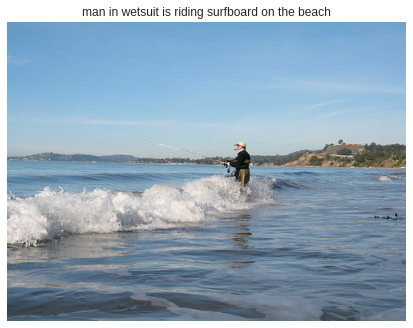

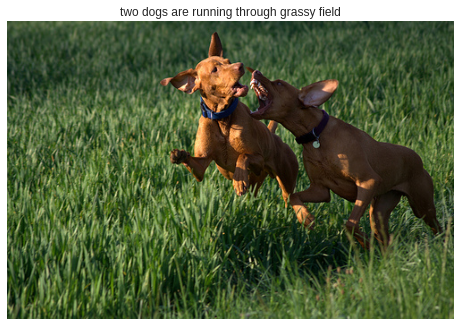

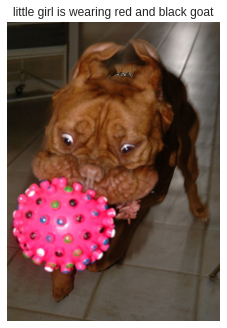

In [ ]:
how_many_pred(20)

#   **THANK YOU**  